# Proof of concept

This is a prototype of a people counter based on convolutional neural network regression. 

## Model

Neural network with the following architecture:

- 32 3x3 convolutions with stride 2
- 32 3x3 convolutions
- 2x2 max pooling with stride 2

- 64 3x3 convolutions with stride 2
- 64 3x3 convolutions
- 2x2 max pooling with stride 2

- 128 3x3 convolutions with stride 2
- 128 3x3 convolutions
- 2x2 max pooling with stride 2

- Fully connected layer with 30 nodes
- 30% dropout
- Output layer


## Training
The model has been trained on 5 manually annotated images. Each image has been rescaled between 50% and 150% and then divided into patches of size `(256, 256)` with 50% overlap. This results in 321 patch per image or 1605 patches in total. Patches with people count between 5 and 20 were oversampled twice; patches with more than 20 people were oversampled once. The total size of the training set after oversampling is 2208 images. See `prepare.py` script for details about preparation of input data.

## Inference
Trained model takes an 256 by 256 rgb image as input and produces a number of people as output. See `predict.py` script for details. 

## Evaluation
The model has been evaluated on three manually annotated images. These images are different from the training set. In other words, the model has not seen these images during training.

In [1]:
import numpy as np
from model import get_model
from PIL import Image
from PIL import ImageFont
from PIL import ImageDraw
import matplotlib
from matplotlib import pyplot as plt
import math

Using TensorFlow backend.


In [2]:
%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (20, 12)
matplotlib.rcParams['figure.dpi'] = 300

In [3]:
# load image patches. 
# Original images are 1280x720. In order to divide it into 256x256 patches, the image is zero-padded to 1280x768.
# This results in 15 256x256 patches per image. There are 3 images, so 45 input patches in total.
# The same procedure has been applied during training. See prepare.py for details.
image_patches = np.load('./data/test/patches.npy')
image_patches = image_patches / 255.
input_shape = image_patches.shape[1:]

# load true counts
true_counts = np.load('./data/test/patch_counts.npy')

In [4]:
# Create a model
model = get_model('qgodeep')
predictor = model.model_for_prediction(input_shape)

# Load model weights that have beed saved after completing training
predictor.load_weights('./out/qgodeep_2018-01-21-15-17-37.h5')

# Make predictions
predictions = predictor.predict(image_patches)

In [5]:
# In this block we draw true and predicted counts on each image patch

font = ImageFont.truetype('calibri.ttf', 20)

labeled_patches = np.empty_like(image_patches, dtype=np.uint8)

for i, (patch, true_count, predicted_count) in enumerate(zip(image_patches, true_counts, predictions)):
    labeled_patch = Image.fromarray(np.uint8(patch * 255))
    draw = ImageDraw.Draw(labeled_patch)
    true_count = int(round(true_count))
    predicted_count = int(round(predicted_count[0]))
    
    # draw background rectangle for text
    draw.rectangle(((5, 230), (180, 260)), fill="black")
    
    # draw true and predicted count
    draw.text((10, 230), 'true:predicted {}:{}'.format(true_count, predicted_count), (255, 255, 255), font=font)
    
    # draw patch boundaries
    draw.line(((0,0), (0, 255)), fill="red", width=3)
    draw.line(((0,0), (255, 0)), fill="red", width=3)
    draw.line(((0,255), (255, 255)), fill="red", width=3)
    draw.line(((255,0), (255, 255)), fill="red", width=3)
    
    labeled_patches[i] = labeled_patch

True:		176
Predicted:	177
Mean diff per patch:	+/-15
Total difference:	1


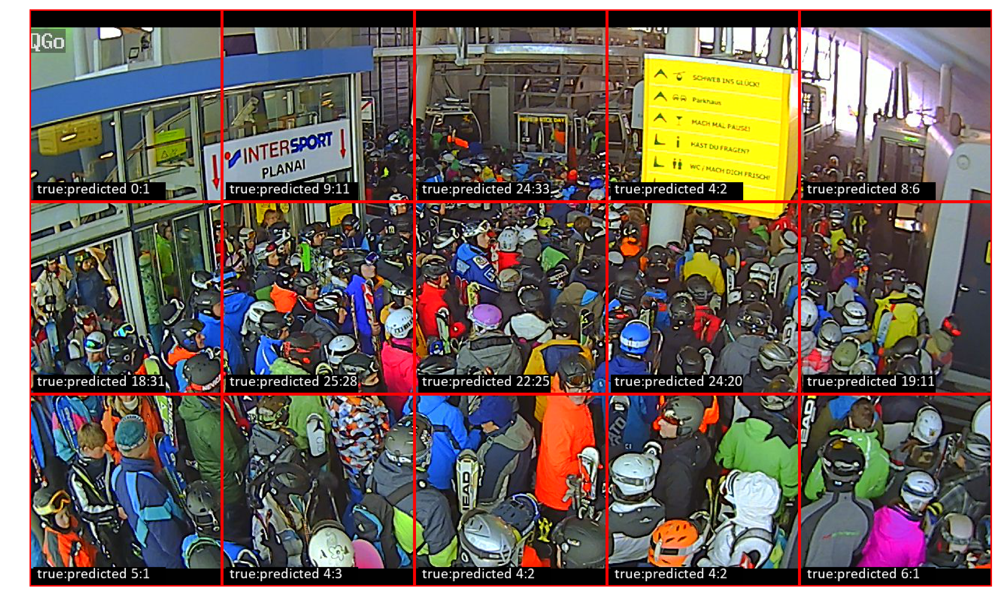

True:		32
Predicted:	44
Mean diff per patch:	+/-6
Total difference:	12


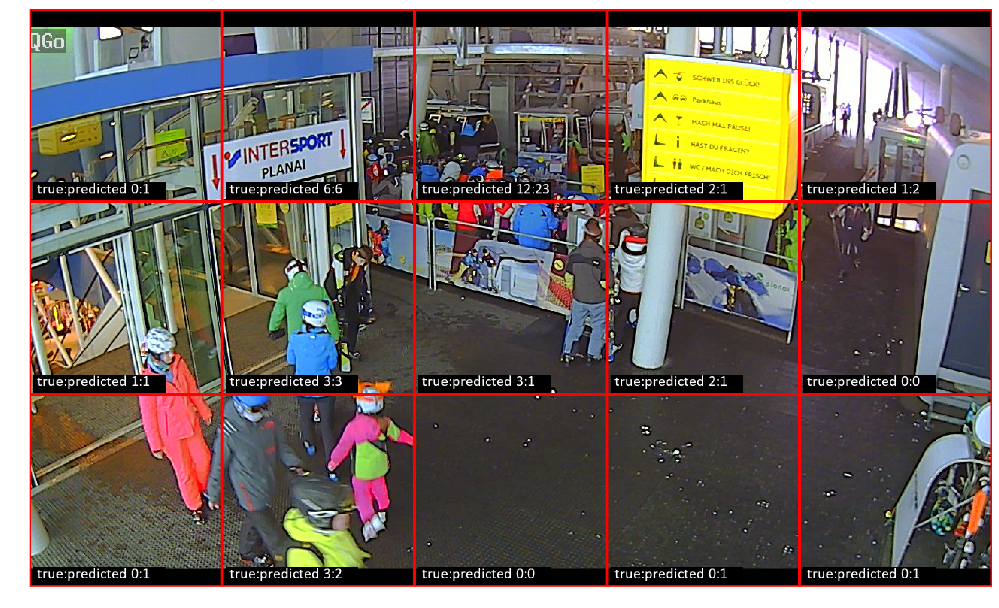

True:		33
Predicted:	42
Mean diff per patch:	+/-4
Total difference:	9


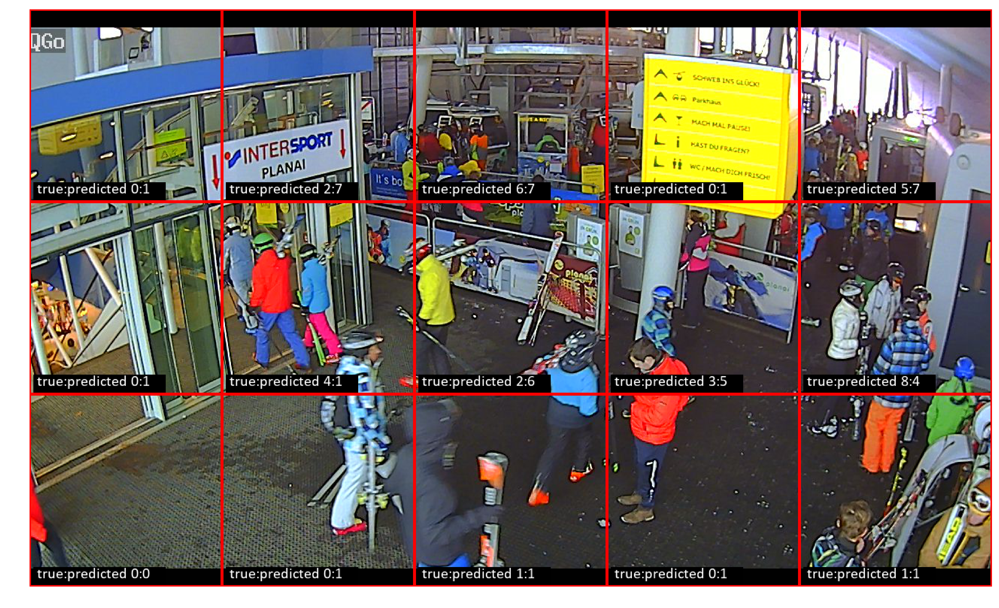

In [8]:
# Evaluation
# here all labelled patches are assembled back to images

for i in range(3):
    # 15 patches make one image
    im = labeled_patches[i * 15: (i + 1) * 15, :, :, :]
    
    # combine patches into an image
    labeled_image = np.concatenate((np.concatenate((im[0:5, :, :, :]), axis=1),
                       np.concatenate((im[5:10, :, :, :]), axis=1),
                       np.concatenate((im[10:15, :, :, :]), axis=1))) 
    
    # get corresponding true and predicted counts
    true_count = int(round(true_counts[i * 15: (i + 1) * 15].sum()))
    predicted_count = int(round(predictions[i * 15: (i + 1) * 15].sum()))
    
    # calculate mean squarred error
    mse = ((true_counts[i * 15: (i + 1) * 15] - predictions[i * 15: (i + 1) * 15]) ** 2).mean()
    
    print('True:\t\t{}'.format(true_count))
    print('Predicted:\t{}'.format(predicted_count))
    print('Mean diff per patch:\t+/-{}'.format(int(round(math.sqrt(mse)))))
    print('Total difference:\t{}'.format(abs(true_count - predicted_count)))
    
    plt.imshow(labeled_image)
    plt.axis('off')
    plt.show()